In [1]:
#importing libraries
import pandas as pd
import numpy as np
import datetime
import math
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
import sklearn
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go


In [2]:
#reading Data
df = pd.read_csv(r'ECA_data.csv', low_memory = False)

In [3]:
#Checkign shape of data
df.shape

(18769, 24)

In [4]:
#Check info and datatype of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18769 entries, 0 to 18768
Data columns (total 24 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         18769 non-null  int64  
 1   LIMIT      18769 non-null  int64  
 2   BALANCE    18769 non-null  float64
 3   INCOME     18769 non-null  int64  
 4   RATING     18769 non-null  int64  
 5   GENDER     18769 non-null  int64  
 6   EDUCATION  18756 non-null  float64
 7   MARITAL    18731 non-null  float64
 8   AGE        18769 non-null  int64  
 9   S1         18769 non-null  int64  
 10  S2         18769 non-null  int64  
 11  S3         18769 non-null  int64  
 12  S4         18769 non-null  int64  
 13  S5         18769 non-null  int64  
 14  B1         18769 non-null  int64  
 15  B2         18769 non-null  int64  
 16  B3         18769 non-null  int64  
 17  B4         18769 non-null  int64  
 18  B5         18769 non-null  int64  
 19  R1         18769 non-null  int64  
 20  R2    

## Question 2

### Check and Removal of NA Values and symbols

In [5]:
#check number of NA/missing values in dataset
print(df.isna().sum())

ID            0
LIMIT         0
BALANCE       0
INCOME        0
RATING        0
GENDER        0
EDUCATION    13
MARITAL      38
AGE           0
S1            0
S2            0
S3            0
S4            0
S5            0
B1            0
B2            0
B3            0
B4            0
B5            0
R1            0
R2            0
R3            0
R4            0
R5            0
dtype: int64


In [6]:
#removal of NA values
df = df.dropna()

#checking NaN Values
print(df.isna().sum())

ID           0
LIMIT        0
BALANCE      0
INCOME       0
RATING       0
GENDER       0
EDUCATION    0
MARITAL      0
AGE          0
S1           0
S2           0
S3           0
S4           0
S5           0
B1           0
B2           0
B3           0
B4           0
B5           0
R1           0
R2           0
R3           0
R4           0
R5           0
dtype: int64


In [7]:
#replacing "," "$" values in dataset
df = df.replace({'\$':'', ',':''}, regex = True)


### Dropping outlying data

In [8]:
def minMax(x):
    return pd.Series(index=['min','max'],data=[x.min(),x.max()])
minmax = df.apply(minMax)
print(minmax.to_string())

        ID   LIMIT    BALANCE  INCOME  RATING  GENDER  EDUCATION  MARITAL  AGE  S1  S2  S3  S4  S5      B1      B2      B3      B4      B5       R1      R2   R3      R4      R5
min      1   10000       0.00   10000       0       0        0.0      0.0   -1  -1  -1  -1  -1  -1  -69777 -157264  -65167  -81334 -209051        0       0    0       0       0
max  18766  800000  130692.45  908846       1       1        3.0      2.0  199   7   8   7   7   7  743970  855086  706864  823540  514975  1227082  889043  999  426529  527143


In [9]:
#Realized that there is abnormalities within the Age in terms of min and max age.
df.drop(df.loc[df['AGE']==199].index, inplace=True)
df.drop(df.loc[df['AGE']==-1].index, inplace=True)

### Removal of duplicates

In [10]:
#Check duplicates
df['duplicates'] = df.duplicated(keep='last')
df.loc[df['duplicates'] == True]

,ID,LIMIT,BALANCE,INCOME,RATING,GENDER,EDUCATION,MARITAL,AGE,S1,...,B2,B3,B4,B5,R1,R2,R3,R4,R5,duplicates
131,132,200000,1270.675,188181,0,1,2.0,1.0,40,-1,...,12610,7850,977,9205,13587,7850,0,9205,0,True
378,378,240000,39804.975,256476,0,1,2.0,2.0,35,0,...,223431,226361,223508,238587,10000,8000,9000,19000,9000,True
421,420,30000,1883.700,32877,1,1,1.0,2.0,23,2,...,11862,12104,12351,8000,2000,242,247,2000,0,True


In [11]:
#Duplicate removal
df = df.drop_duplicates()

In [12]:
#check for duplicates
df['duplicates'] = df.duplicated(keep='last')
df.loc[df['duplicates'] == True]

,ID,LIMIT,BALANCE,INCOME,RATING,GENDER,EDUCATION,MARITAL,AGE,S1,...,B2,B3,B4,B5,R1,R2,R3,R4,R5,duplicates


### Readjusting Datatypes

In [13]:
# Changing to the right data format
df = df.astype({'ID': 'category', 
                'LIMIT': 'float',
                'BALANCE': 'float', 
                'INCOME': 'float',
                'RATING': 'category', 
                'GENDER': 'category', 
                'EDUCATION': 'category',
                'MARITAL': 'category',
                'AGE': 'int',
                'S1': 'category',
                'S2':'category',
                'S3':'category',
                'S4':'category',
                'S5':'category',
                'B1': 'float',
                'B2':'float',
                'B3':'float',
                'B4':'float',
                'B5': 'float',
                'R1':'float',
                'R2':'float',
                'R3':'float',
                'R4':'float',
                'R5':'float',})

In [14]:
#Check info and datatype of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18710 entries, 0 to 18768
Data columns (total 25 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ID          18710 non-null  category
 1   LIMIT       18710 non-null  float64 
 2   BALANCE     18710 non-null  float64 
 3   INCOME      18710 non-null  float64 
 4   RATING      18710 non-null  category
 5   GENDER      18710 non-null  category
 6   EDUCATION   18710 non-null  category
 7   MARITAL     18710 non-null  category
 8   AGE         18710 non-null  int32   
 9   S1          18710 non-null  category
 10  S2          18710 non-null  category
 11  S3          18710 non-null  category
 12  S4          18710 non-null  category
 13  S5          18710 non-null  category
 14  B1          18710 non-null  float64 
 15  B2          18710 non-null  float64 
 16  B3          18710 non-null  float64 
 17  B4          18710 non-null  float64 
 18  B5          18710 non-null  float64 
 19  R1  

### Binning data values

In [15]:
#creating bins to reflect the values of repayment based on Bill Repaid, Minimum Paid and Delayed.
df['S1_Repayment_Status'] = pd.cut(df["S1"], bins = [-2,-1,0,10], labels=['Bill Repaid','Minimum Paid','Delayed'])
df['S2_Repayment_Status'] = pd.cut(df["S2"], bins = [-2,-1,0,10], labels=['Bill Repaid','Minimum Paid','Delayed'])
df['S3_Repayment_Status'] = pd.cut(df["S3"], bins = [-2,-1,0,10], labels=['Bill Repaid','Minimum Paid','Delayed'])
df['S4_Repayment_Status'] = pd.cut(df["S4"], bins = [-2,-1,0,10], labels=['Bill Repaid','Minimum Paid','Delayed'])
df['S5_Repayment_Status'] = pd.cut(df["S5"], bins = [-2,-1,0,10], labels=['Bill Repaid','Minimum Paid','Delayed'])

#checking new rows 
df

,ID,LIMIT,BALANCE,INCOME,RATING,GENDER,EDUCATION,MARITAL,AGE,S1,...,R2,R3,R4,R5,duplicates,S1_Repayment_Status,S2_Repayment_Status,S3_Repayment_Status,S4_Repayment_Status,S5_Repayment_Status
0,1,210000.0,0.000,235822.0,1,1,1.0,2.0,30,0,...,0.0,0.0,0.0,0.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid
1,2,260000.0,10928.050,278481.0,0,0,2.0,2.0,31,0,...,2000.0,2000.0,2000.0,72000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid
2,3,400000.0,65397.850,431993.0,0,0,3.0,1.0,51,0,...,14000.0,11500.0,8000.0,7000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid
3,4,20000.0,3695.300,22368.0,0,0,2.0,1.0,58,-1,...,0.0,28740.0,1565.0,0.0,False,Bill Repaid,Delayed,Delayed,Bill Repaid,Bill Repaid
4,5,180000.0,68.250,166900.0,0,1,2.0,1.0,42,0,...,2056.0,4300.0,1802.0,3691.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18764,18762,220000.0,33065.900,225862.0,0,0,3.0,1.0,39,0,...,5003.0,3047.0,5000.0,1000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid
18765,18763,150000.0,294.525,149966.0,0,0,3.0,2.0,43,-1,...,8998.0,129.0,0.0,0.0,False,Bill Repaid,Bill Repaid,Bill Repaid,Minimum Paid,Minimum Paid
18766,18764,30000.0,623.875,30327.0,1,0,2.0,2.0,37,3,...,22000.0,4200.0,2000.0,3100.0,False,Delayed,Delayed,Bill Repaid,Minimum Paid,Minimum Paid
18767,18765,80000.0,0.000,94607.0,1,0,3.0,1.0,41,-1,...,1178.0,1926.0,52964.0,1804.0,False,Bill Repaid,Minimum Paid,Minimum Paid,Minimum Paid,Bill Repaid


In [16]:
#creating bins to reflect the values of age to navigate through them
df['AGE_BINS'] = pd.cut(df['AGE'], bins=[20, 29, 39, 49,59,69,79,89], labels=['20-29','30-39','40-49','50-59','60-69','70-79','80-89'])
#checking new rows
df

,ID,LIMIT,BALANCE,INCOME,RATING,GENDER,EDUCATION,MARITAL,AGE,S1,...,R3,R4,R5,duplicates,S1_Repayment_Status,S2_Repayment_Status,S3_Repayment_Status,S4_Repayment_Status,S5_Repayment_Status,AGE_BINS
0,1,210000.0,0.000,235822.0,1,1,1.0,2.0,30,0,...,0.0,0.0,0.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,30-39
1,2,260000.0,10928.050,278481.0,0,0,2.0,2.0,31,0,...,2000.0,2000.0,72000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,30-39
2,3,400000.0,65397.850,431993.0,0,0,3.0,1.0,51,0,...,11500.0,8000.0,7000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,50-59
3,4,20000.0,3695.300,22368.0,0,0,2.0,1.0,58,-1,...,28740.0,1565.0,0.0,False,Bill Repaid,Delayed,Delayed,Bill Repaid,Bill Repaid,50-59
4,5,180000.0,68.250,166900.0,0,1,2.0,1.0,42,0,...,4300.0,1802.0,3691.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,40-49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18764,18762,220000.0,33065.900,225862.0,0,0,3.0,1.0,39,0,...,3047.0,5000.0,1000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,30-39
18765,18763,150000.0,294.525,149966.0,0,0,3.0,2.0,43,-1,...,129.0,0.0,0.0,False,Bill Repaid,Bill Repaid,Bill Repaid,Minimum Paid,Minimum Paid,40-49
18766,18764,30000.0,623.875,30327.0,1,0,2.0,2.0,37,3,...,4200.0,2000.0,3100.0,False,Delayed,Delayed,Bill Repaid,Minimum Paid,Minimum Paid,30-39
18767,18765,80000.0,0.000,94607.0,1,0,3.0,1.0,41,-1,...,1926.0,52964.0,1804.0,False,Bill Repaid,Minimum Paid,Minimum Paid,Minimum Paid,Bill Repaid,40-49


### Reducing Categories

In [17]:
df["MARITAL"].value_counts()

2.0    9822
1.0    8699
0.0     189
Name: MARITAL, dtype: int64

In [18]:
#reducing categories as others are a small value that should either be categories as single or married, in this case just single, if they are divorced/complicated it should still be single
df["MARITAL"].replace(to_replace=0, value=1,inplace = True)
df["MARITAL"].info

#reducing categories of payment amounts based on just minimally paid, delayed, and bill paid
df[["S1","S2","S3","S4","S5"]].replace(to_replace=(2,3,4,5,6,7,8), value=1,inplace = True)

#Checking data
print(df["MARITAL"].value_counts())
print(df[["S1","S2","S3","S4","S5"]].value_counts())

2.0    9822
1.0    8888
Name: MARITAL, dtype: int64
S1  S2  S3  S4  S5
0   0   0   0   0     9078
-1  -1  -1  -1  -1    1348
1   1   1   1   1      835
    0   0   0   0      530
0   0   0   0   -1     341
                      ... 
1   -1  1   0   -1       1
-1  -1  1   -1  1        1
0   0   -1  1   -1       1
1   0   -1  1   0        1
    1   -1  1   0        1
Length: 180, dtype: int64


C:\Users\mkumar\AppData\Local\Temp\ipykernel_27424\2744762639.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[["S1","S2","S3","S4","S5"]].replace(to_replace=(2,3,4,5,6,7,8), value=1,inplace = True)


### Normalizing Data

In [19]:
#normalizing data for regression if needed
from sklearn import preprocessing
X_train = df[['LIMIT','BALANCE','INCOME','B1','B2','B3','B4','B5','R1','R2','R3','R4','R5']]
X_normalized = sklearn.preprocessing.normalize(X_train)

print (X_normalized)


[[0.6650366  0.         0.74681077 ... 0.         0.         0.        ]
 [0.65282434 0.02743883 0.69922759 ... 0.00502173 0.00502173 0.18078212]
 [0.44085451 0.07207734 0.47611515 ... 0.01267457 0.00881709 0.00771495]
 ...
 [0.50080482 0.01041465 0.50626359 ... 0.07011267 0.03338699 0.05174983]
 [0.42482118 0.         0.50238821 ... 0.01022757 0.28125286 0.00957972]
 [0.4624658  0.07757933 0.37244221 ... 0.00924932 0.00924932 0.00924932]]


## Question 3

In [20]:
# Plotting histogram with plotly, setting x-axis as AGE, y-axis as count, Gender by color 1 meaning Female, 0 meaning male

fig = px.histogram(df, x="AGE_BINS", 
                   color='GENDER', 
                   barmode='group',
                   histfunc='count',
                   #nbins=8,
                   height=400, 
                   title = "Age and Gender Types", 
                   text_auto = "1s")
fig.update_xaxes(categoryorder='array', categoryarray=['20-29','30-39','40-49','50-59','60-69','70-79','80-89'])
fig.show()

In [21]:
# Plotting histogram with plotly, setting x-axis as loan limit, y-axis as count, Education by color 0: Others, 1: Postgraduate, 2: Tertiary, 3: High School
fig = px.histogram(df, x="LIMIT", 
                   color='EDUCATION', 
                   barmode='group',
                   histfunc='count',
                   nbins=8,
                   height=400, 
                   title = "Loan Limit and Education Types", 
                   text_auto = "1s",
                  labels={'ID':"Number of customers", '1.0':'Number of customers'})
fig.show()

In [22]:
# Plotting scatterplot with plotly, setting x-axis as income, y-axis as count, Education by color 0: Others, 1: Postgraduate, 2: Tertiary, 3: High School

fig = px.scatter(df, x="AGE", y="INCOME", size='LIMIT', height=400, 
                title = "Income Vs Age"  
                #color="EDUCATION", hover_data=['petal_width']
                )
fig.show()

In [23]:
# Plotting bargraph with plotly, setting x-axis as loan limit, y-axis as count, Education by color 0:Others,1:PostGrad
fig = px.histogram(df, x="GENDER", y="INCOME", 
                   color='RATING',
                   #pattern_shape="GENDER",
                   barmode='relative',
                   histfunc='avg',
                   height=400, 
                   title = "Average income, based on gender", 
                   text_auto = "1s")
fig.show()

In [24]:
# Plotting plotting a box and whiskers graph for amounts billable across 5 months, to determine the general amount  owed per month and whether debts have been better cleared 

y0 = df['B1'] 
y1 = df['B2'] 
y2 = df['B3'] 
y3 = df['B4']
y4 = df['B5']
fig = go.Figure()
fig.add_trace(go.Box(
    y= y0,
    name='Billable this month',
    boxpoints =False,
    marker_color='#3D9970'))
fig.add_trace(go.Box(
    y= y1,
    name='Billable 1 month(s) ago',
    boxpoints =False,
    marker_color='#FF4136'))
fig.add_trace(go.Box(
    y= y2,
    name='Billable 2 month(s) ago',
    boxpoints =False,
    marker_color='#FF851B'))
fig.add_trace(go.Box(
    y= y3,
    name='Billable 3 month(s) ago',
    boxpoints =False,
    marker_color='rgb(8,81,156)'))
fig.add_trace(go.Box(
    y= y4,
    name='Billable 4 month(s) ago',
    boxpoints =False,
    marker_color='rgb(107,174,214)'))

fig.update_layout(height=700,
                  title = "Box Plot for billable amount every month")

fig.show()

## Question 4

In [25]:
#conduct a train test split of the data so as to be able to test machine learning model later on
X = df[['LIMIT', 'BALANCE', 'INCOME', 'GENDER', 'EDUCATION', 'MARITAL', 'AGE','S1','S2','S3','S4','S5','B2','B3','B4','B5','R1','R2','R3','R4','R5','RATING']]
y = df['B1']

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.33, random_state=42)
regr = LinearRegression()



In [26]:
#standardizing the data such that 
scaler = preprocessing.StandardScaler()
scaler.fit(X_train)
normalized_x_train = scaler.transform(X_train)
scaler.fit(X_test)
normalized_X_test = scaler.transform(X_test)


In [27]:
#fitting data into a regression model
regr.fit(normalized_x_train, y_train)
y_pred = regr.predict(normalized_X_test)

#gathering mean and standard deviations
print("Mean: \n", normalized_x_train.mean(axis=0))
print("Standard Deviation: \n", normalized_x_train.std(axis=0))

# The coefficients
print("Coefficients: \n", regr.coef_)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination (R-squared): %.2f" % r2_score(y_test, y_pred))

train_score = regr.score(normalized_x_train, y_train)
print("The training score of the model is: ", train_score)
test_score = regr.score(normalized_X_test, y_test)
print("The score of the model on test data is:", test_score )
print('Intercept: \n', regr.intercept_)

Mean: 
 [ 6.97221831e-17 -5.32836196e-17 -7.25564182e-17 -4.64814554e-17
  1.30374814e-16  1.10535168e-16  9.52302988e-17 -7.36901122e-17
  4.13798322e-17 -1.92727986e-17  4.30803733e-17 -4.30803733e-17
  1.70054105e-18  5.58344312e-17 -9.63639929e-18 -1.58717165e-17
 -3.96792912e-18  1.70054105e-17  3.00428919e-17 -5.66847017e-18
  1.98396456e-17  5.49841606e-17]
Standard Deviation: 
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
Coefficients: 
 [   87.02061292 33192.16568442    50.46048363  -108.76771896
   -51.08394331   146.17119179    45.12883925  -720.59306132
  1452.82405378  -408.08726516  -293.0190945   -111.70405559
 41610.68355521 -3978.30515557   194.77528972  1360.90041564
 -5891.03069104  2563.75938997  -183.96903767  -222.75503298
  -424.46243588    80.7326288 ]
Mean squared error: 296189510.77
Coefficient of determination (R-squared): 0.94
The training score of the model is:  0.9480160412830605
The score of the model on test data is: 0.943768585744

In [28]:
#prediction based on X test to determine Y values
print(y_pred)
print(y_test)

[   616.49763433 104349.38370777   6261.84687966 ...  68614.63276718
 162732.15580324 138251.70593783]
57         1562.0
6026     106217.0
10714     12625.0
13889     91832.0
10876    210333.0
           ...   
18097     67229.0
13981      4925.0
10128     69398.0
9456     175790.0
8535     173354.0
Name: B1, Length: 6175, dtype: float64


In [29]:
#Train test split to split the data into two different data sets
X_train, X_test, y_train, y_test = train_test_split(df['B1'], df['INCOME'], test_size=0.33, random_state=42)
regr = LinearRegression()

X_train = X_train.values.reshape(-1, 1)
X_test = X_test.values.reshape(-1, 1)

In [30]:
#Normalizing and standardizing data with Standard Scaler
scaler = preprocessing.StandardScaler()
scaler.fit(X_train)
normalized_x_train = scaler.transform(X_train)
scaler.fit(X_test)
normalized_X_test = scaler.transform(X_test)

regr.fit(normalized_x_train, y_train)

LinearRegression()

In [31]:
train_score = regr.score(normalized_x_train, y_train)
print("The training score of the model is: ", train_score)
test_score = regr.score(normalized_X_test, y_test)
print("The score of the model on test data is:", test_score )

The training score of the model is:  0.07914145051804711
The score of the model on test data is: 0.07162529073779889


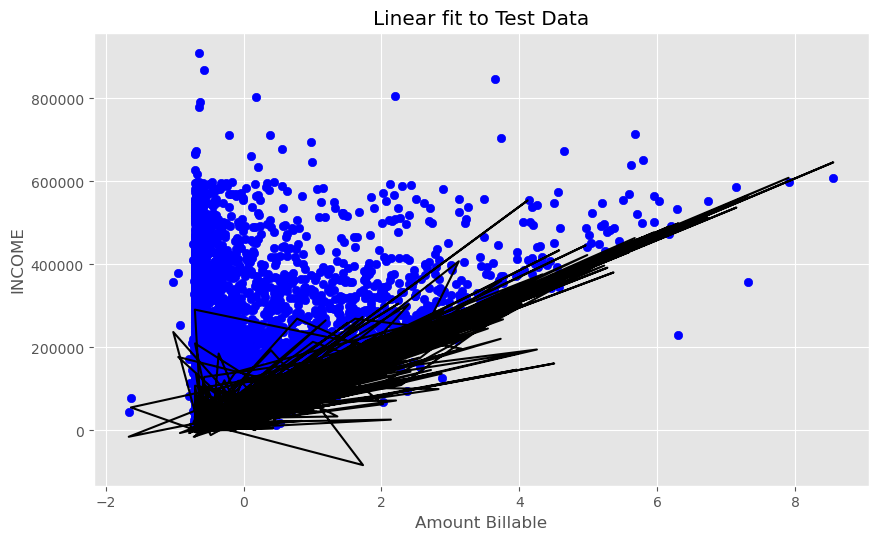

Coefficients: 
 [40235.03371328]
Mean squared error: 37099525175.61
Coefficient of determination: -0.80


In [32]:

plt.figure(figsize=(10,6), dpi=100)
plt.style.use('ggplot')
plt.scatter(normalized_X_test, y_test, color='b')
plt.xlabel('Amount Billable')
plt.ylabel('INCOME')
plt.title('Linear fit to Test Data')
plt.plot(normalized_X_test, y_pred, color='k')

plt.show()

# The coefficients
print("Coefficients: \n", regr.coef_)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred))

### Train Test Split

In [33]:
#splitting data for regression if needed
from sklearn.model_selection import train_test_split
X = X_normalized
y = list(X_normalized)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

df

,ID,LIMIT,BALANCE,INCOME,RATING,GENDER,EDUCATION,MARITAL,AGE,S1,...,R3,R4,R5,duplicates,S1_Repayment_Status,S2_Repayment_Status,S3_Repayment_Status,S4_Repayment_Status,S5_Repayment_Status,AGE_BINS
0,1,210000.0,0.000,235822.0,1,1,1.0,2.0,30,0,...,0.0,0.0,0.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,30-39
1,2,260000.0,10928.050,278481.0,0,0,2.0,2.0,31,0,...,2000.0,2000.0,72000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,30-39
2,3,400000.0,65397.850,431993.0,0,0,3.0,1.0,51,0,...,11500.0,8000.0,7000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,50-59
3,4,20000.0,3695.300,22368.0,0,0,2.0,1.0,58,-1,...,28740.0,1565.0,0.0,False,Bill Repaid,Delayed,Delayed,Bill Repaid,Bill Repaid,50-59
4,5,180000.0,68.250,166900.0,0,1,2.0,1.0,42,0,...,4300.0,1802.0,3691.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,40-49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18764,18762,220000.0,33065.900,225862.0,0,0,3.0,1.0,39,0,...,3047.0,5000.0,1000.0,False,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,Minimum Paid,30-39
18765,18763,150000.0,294.525,149966.0,0,0,3.0,2.0,43,-1,...,129.0,0.0,0.0,False,Bill Repaid,Bill Repaid,Bill Repaid,Minimum Paid,Minimum Paid,40-49
18766,18764,30000.0,623.875,30327.0,1,0,2.0,2.0,37,1,...,4200.0,2000.0,3100.0,False,Delayed,Delayed,Bill Repaid,Minimum Paid,Minimum Paid,30-39
18767,18765,80000.0,0.000,94607.0,1,0,3.0,1.0,41,-1,...,1926.0,52964.0,1804.0,False,Bill Repaid,Minimum Paid,Minimum Paid,Minimum Paid,Bill Repaid,40-49


In [34]:
regr = linear_model.LinearRegression()
regr.fit(X_train, y_train)
y_pred = regr.predict(X_test)

### Draft

In [35]:
scaler = preprocessing.StandardScaler().fit(X_train)
scaler
print (scaler.mean_)


[0.57839818 0.03602626 0.58348905 0.19700764 0.18734077 0.17447959
 0.15740596 0.15154768 0.02295218 0.02169092 0.01870035 0.01795528
 0.01895233]


In [36]:
scaler = preprocessing.StandardScaler()
scaler.fit(X_train)
X_scaled = scaler.transform(X_train)

print(X_scaled)

print(X_scaled.mean(axis=0))


print(X_scaled.std(axis=0))

[[ 0.53632015 -1.02250715  1.24021671 ... -0.36924777 -0.37390049
  -0.36335348]
 [-0.29067006  0.35033325 -0.10672646 ... -0.14134675 -0.16705957
  -0.15388945]
 [ 1.23488118 -1.08222168  0.70465412 ... -0.40835569 -0.41532651
  -0.40127207]
 ...
 [ 0.12163621  0.01179733  0.8507783  ...  0.23913333 -0.41532651
  -0.20874738]
 [-0.74632858  0.56217189 -0.26516698 ... -0.15429606 -0.03856007
  -0.10567212]
 [ 0.4936621  -0.95877646  1.21227315 ...  0.11349842 -0.1975416
   0.0356525 ]]
[-8.67050969e-15  3.58495310e-16 -4.64348677e-15 -6.67360507e-15
 -1.37292119e-15 -2.36792370e-15  4.15550234e-15  1.73162907e-16
  1.29470959e-15  6.57338829e-16  1.79597063e-15  5.04544773e-16
  4.09773930e-16]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [37]:
# Plotting bargraph with plotly, setting x-axis as loan limit, y-axis as count, Education by color 0:Others,1:PostGrad
import plotly.graph_objects as go
fig = px.histogram(df, x="AGE", y="BALANCE", 
                  # color='RATING',
                   #pattern_shape="GENDER",
                   barmode='relative',
                   histfunc='count',
                   nbins=8,
                   height=400, 
                   title = "Average income, based on gender", 
                   text_auto = "1s")
fig.show()

In [38]:
#normalizing data for regression if needed
from sklearn import preprocessing
B1_train = df['B1'].reshape((-1, 1))
B1_normalized = sklearn.preprocessing.normalize(B1_train)

print (B1_normalized)

AttributeError: 'Series' object has no attribute 'reshape'

In [ ]:
x = df['AGE']
y = df['INCOME']

fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count", y=y, x=x, name="count", nbinsx=8))
fig.add_trace(go.Histogram(histfunc="sum", y=y, x=x, name="sum", nbinsx=8))

fig.show()